In [1]:
# scientific computing libaries
import pandas as pd
import numpy as np

# data mining libaries
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA#, FastICA
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, GridSearchCV, learning_curve
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from imblearn.pipeline import make_pipeline, Pipeline
from imblearn.over_sampling import SMOTE

#plot libaries
import plotly
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True) # to show plots in notebook

# online plotly
#from plotly.plotly import plot, iplot
#plotly.tools.set_credentials_file(username='XXXXXXXXXXXXXXX', api_key='XXXXXXXXXXXXXXX')

# offline plotly
from plotly.offline import plot, iplot

# do not show any warnings
import warnings
warnings.filterwarnings('ignore')

SEED = 2020 # specify seed for reproducable results
pd.set_option('display.max_columns', None) # prevents abbreviation (with '...') of columns in prints

In [2]:
core = pd.read_csv("C:/Users/Shatabdi/Documents/B73_V5_data/final_data_for_Db/collection/All_data.txt",sep='\t')
core = core.drop_duplicates(subset='ID', keep="first")
core.head()

,ID,classical_label,Origin,core_label,DCC_Twist_Tilt_lag_1,DCC_Twist_Tilt_lag_2,DCC_Tilt_Twist_lag_1,DCC_Tilt_Twist_lag_2,DACC_Twist_lag1,DACC_Twist_lag2,DACC_Tilt_lag1,DACC_Tilt_lag2,DACC_Twist_Tilt_lag_1,DACC_Twist_Tilt_lag_2,DACC_Tilt_Twist_lag_1,DACC_Tilt_Twist_lag_2,TCC_Dnase_I_Nucleosome_lag_1,TCC_Dnase_I_Nucleosome_lag_2,TCC_Nucleosome_Dnase_I_lag_1,TCC_Nucleosome_Dnase_I_lag_2,TACC_Dnase_I_lag1,TACC_Dnase_I_lag2,TACC_Nucleosome_lag1,TACC_Nucleosome_lag2,TACC_Dnase_I_Nucleosome_lag_1,TACC_Dnase_I_Nucleosome_lag_2,TACC_Nucleosome_Dnase_I_lag_1,TACC_Nucleosome_Dnase_I_lag_2,PseDNC_Xc1_AA,PseDNC_Xc1_AC,PseDNC_Xc1_AG,PseDNC_Xc1_AT,PseDNC_Xc1_CA,PseDNC_Xc1_CC,PseDNC_Xc1_CG,PseDNC_Xc1_CT,PseDNC_Xc1_GA,PseDNC_Xc1_GC,PseDNC_Xc1_GG,PseDNC_Xc1_GT,PseDNC_Xc1_TA,PseDNC_Xc1_TC,PseDNC_Xc1_TG,PseDNC_Xc1_TT,PseDNC_Xc2_lambda_1,PseDNC_Xc2_lambda_2,PseDNC_Xc2_lambda_3,PseKNC_3_Xc1_AAA,PseKNC_3_Xc1_AAC,PseKNC_3_Xc1_AAG,PseKNC_3_Xc1_AAT,PseKNC_3_Xc1_ACA,PseKNC_3_Xc1_ACC,PseKNC_3_Xc1_ACG,PseKNC_3_Xc1_ACT,PseKNC_3_Xc1_AGA,PseKNC_3_Xc1_AGC,PseKNC_3_Xc1_AGG,PseKNC_3_Xc1_AGT,PseKNC_3_Xc1_ATA,PseKNC_3_Xc1_ATC,PseKNC_3_Xc1_ATG,PseKNC_3_Xc1_ATT,PseKNC_3_Xc1_CAA,PseKNC_3_Xc1_CAC,PseKNC_3_Xc1_CAG,PseKNC_3_Xc1_CAT,PseKNC_3_Xc1_CCA,PseKNC_3_Xc1_CCC,PseKNC_3_Xc1_CCG,PseKNC_3_Xc1_CCT,PseKNC_3_Xc1_CGA,PseKNC_3_Xc1_CGC,PseKNC_3_Xc1_CGG,PseKNC_3_Xc1_CGT,PseKNC_3_Xc1_CTA,PseKNC_3_Xc1_CTC,PseKNC_3_Xc1_CTG,PseKNC_3_Xc1_CTT,PseKNC_3_Xc1_GAA,PseKNC_3_Xc1_GAC,PseKNC_3_Xc1_GAG,PseKNC_3_Xc1_GAT,PseKNC_3_Xc1_GCA,PseKNC_3_Xc1_GCC,PseKNC_3_Xc1_GCG,PseKNC_3_Xc1_GCT,PseKNC_3_Xc1_GGA,PseKNC_3_Xc1_GGC,PseKNC_3_Xc1_GGG,PseKNC_3_Xc1_GGT,PseKNC_3_Xc1_GTA,PseKNC_3_Xc1_GTC,PseKNC_3_Xc1_GTG,PseKNC_3_Xc1_GTT,PseKNC_3_Xc1_TAA,PseKNC_3_Xc1_TAC,PseKNC_3_Xc1_TAG,PseKNC_3_Xc1_TAT,PseKNC_3_Xc1_TCA,PseKNC_3_Xc1_TCC,PseKNC_3_Xc1_TCG,PseKNC_3_Xc1_TCT,PseKNC_3_Xc1_TGA,PseKNC_3_Xc1_TGC,PseKNC_3_Xc1_TGG,PseKNC_3_Xc1_TGT,PseKNC_3_Xc1_TTA,PseKNC_3_Xc1_TTC,PseKNC_3_Xc1_TTG,PseKNC_3_Xc1_TTT,PseKNC_3_Xc2_lambda_1,PseKNC_3_Xc2_lambda_2,PseKNC_3_Xc2_lambda_3,PseKNC_5_Xc1_AAA,PseKNC_5_Xc1_AAC,PseKNC_5_Xc1_AAG,PseKNC_5_Xc1_AAT,PseKNC_5_Xc1_ACA,PseKNC_5_Xc1_ACC,PseKNC_5_Xc1_ACG,PseKNC_5_Xc1_ACT,PseKNC_5_Xc1_AGA,PseKNC_5_Xc1_AGC,PseKNC_5_Xc1_AGG,PseKNC_5_Xc1_AGT,PseKNC_5_Xc1_ATA,PseKNC_5_Xc1_ATC,PseKNC_5_Xc1_ATG,PseKNC_5_Xc1_ATT,PseKNC_5_Xc1_CAA,PseKNC_5_Xc1_CAC,PseKNC_5_Xc1_CAG,PseKNC_5_Xc1_CAT,PseKNC_5_Xc1_CCA,PseKNC_5_Xc1_CCC,PseKNC_5_Xc1_CCG,PseKNC_5_Xc1_CCT,PseKNC_5_Xc1_CGA,PseKNC_5_Xc1_CGC,PseKNC_5_Xc1_CGG,PseKNC_5_Xc1_CGT,PseKNC_5_Xc1_CTA,PseKNC_5_Xc1_CTC,PseKNC_5_Xc1_CTG,PseKNC_5_Xc1_CTT,PseKNC_5_Xc1_GAA,PseKNC_5_Xc1_GAC,PseKNC_5_Xc1_GAG,PseKNC_5_Xc1_GAT,PseKNC_5_Xc1_GCA,PseKNC_5_Xc1_GCC,PseKNC_5_Xc1_GCG,PseKNC_5_Xc1_GCT,PseKNC_5_Xc1_GGA,PseKNC_5_Xc1_GGC,PseKNC_5_Xc1_GGG,PseKNC_5_Xc1_GGT,PseKNC_5_Xc1_GTA,PseKNC_5_Xc1_GTC,PseKNC_5_Xc1_GTG,PseKNC_5_Xc1_GTT,PseKNC_5_Xc1_TAA,PseKNC_5_Xc1_TAC,PseKNC_5_Xc1_TAG,PseKNC_5_Xc1_TAT,PseKNC_5_Xc1_TCA,PseKNC_5_Xc1_TCC,PseKNC_5_Xc1_TCG,PseKNC_5_Xc1_TCT,PseKNC_5_Xc1_TGA,PseKNC_5_Xc1_TGC,PseKNC_5_Xc1_TGG,PseKNC_5_Xc1_TGT,PseKNC_5_Xc1_TTA,PseKNC_5_Xc1_TTC,PseKNC_5_Xc1_TTG,PseKNC_5_Xc1_TTT,PseKNC_5_Xc2_lambda_1,PseKNC_5_Xc2_lambda_2,PseKNC_5_Xc2_lambda_3,PseKNC_5_Xc2_lambda_4,PseKNC_5_Xc2_lambda_5,Ear_(E2+E3+E4+E5+E8)_Activation,Ear_(E1+E9)low_signal,Ear_E6_Repression/Activation,Ear_E7_Repression,Leaf_E5_Activation,Leaf_E4_Activation,Leaf_(E2+E8+E9)_Activation,Leaf_E1_Activation,Leaf_E11_Activation,Leaf_E3_Activation,Leaf_E10_Activation,Leaf_E7_Low_signal,Leaf_E6_Repression,acds,ARF_10,ARF_13,ARF_14,ARF_16,ARF_18,ARF_25,ARF_27,ARF_29,ARF_34,ARF_35,ARF_36,ARF_39,ARF_4,ARF_7,BAD_1,BZIP_25,BZIP_54,BZIP_57,BZIP_72,BZIP_96,atac_ear,atac_leaf,B73_UniformMu_withW22,dTSS_root,dTSS_shoot,Enhancer_Husk,Enhancer_Seedling,V5_TE,EREB71,EREB_127,EREB_138,EREB_29,LBD19,LBD38,LBD5,SBP30,SBP6,SBP8,strand_KN1_ear_summit,strand_TB1_rep1_summit,strand_TB1_rep2_summit,acds_1kb,1kb_ARF_10,1kb_ARF_13,1kb_ARF_14,1kb_ARF_16,1kb_ARF_18,1kb_ARF_25,1kb_ARF_27,1kb_ARF_29,1kb_ARF_34,1kb_ARF

In [3]:
core = core.drop(['Sorghum_v3_1_annotation', 'Tzi8'], axis = 1)
# core.head() 

In [4]:
cat_col = ['ID','classical_label','core_label','Origin','Subcel1','Subcel2','Subcel3','Subcel4','Subcel5','Localization','Type','chromosome']
for col in core.columns:
    if col not in cat_col and core[col].dtypes == 'object':
        core[col] = core[col].replace('None', np.nan)
        core[col] = core[col].replace('none', np.nan)
        core[col] = core[col].replace('NA16', np.nan)
        core[col] = core[col].replace('#VALUE!', np.nan)
        core[col] = core[col].astype(float)
core.dtypes

ID                                        object
classical_label                           object
Origin                                    object
core_label                                object
DCC_Twist_Tilt_lag_1                     float64
                                          ...   
variants_effect_stop_gained              float64
variants_effect_stop_lost                float64
variants_effect_stop_retained_variant    float64
variants_effect_synonymous_variant       float64
variants_effect_upstream_gene_variant    float64
Length: 14294, dtype: object

In [5]:
Extra_test = core[core['core_label'] == 'None']
Extra_test.head()

,ID,classical_label,Origin,core_label,DCC_Twist_Tilt_lag_1,DCC_Twist_Tilt_lag_2,DCC_Tilt_Twist_lag_1,DCC_Tilt_Twist_lag_2,DACC_Twist_lag1,DACC_Twist_lag2,DACC_Tilt_lag1,DACC_Tilt_lag2,DACC_Twist_Tilt_lag_1,DACC_Twist_Tilt_lag_2,DACC_Tilt_Twist_lag_1,DACC_Tilt_Twist_lag_2,TCC_Dnase_I_Nucleosome_lag_1,TCC_Dnase_I_Nucleosome_lag_2,TCC_Nucleosome_Dnase_I_lag_1,TCC_Nucleosome_Dnase_I_lag_2,TACC_Dnase_I_lag1,TACC_Dnase_I_lag2,TACC_Nucleosome_lag1,TACC_Nucleosome_lag2,TACC_Dnase_I_Nucleosome_lag_1,TACC_Dnase_I_Nucleosome_lag_2,TACC_Nucleosome_Dnase_I_lag_1,TACC_Nucleosome_Dnase_I_lag_2,PseDNC_Xc1_AA,PseDNC_Xc1_AC,PseDNC_Xc1_AG,PseDNC_Xc1_AT,PseDNC_Xc1_CA,PseDNC_Xc1_CC,PseDNC_Xc1_CG,PseDNC_Xc1_CT,PseDNC_Xc1_GA,PseDNC_Xc1_GC,PseDNC_Xc1_GG,PseDNC_Xc1_GT,PseDNC_Xc1_TA,PseDNC_Xc1_TC,PseDNC_Xc1_TG,PseDNC_Xc1_TT,PseDNC_Xc2_lambda_1,PseDNC_Xc2_lambda_2,PseDNC_Xc2_lambda_3,PseKNC_3_Xc1_AAA,PseKNC_3_Xc1_AAC,PseKNC_3_Xc1_AAG,PseKNC_3_Xc1_AAT,PseKNC_3_Xc1_ACA,PseKNC_3_Xc1_ACC,PseKNC_3_Xc1_ACG,PseKNC_3_Xc1_ACT,PseKNC_3_Xc1_AGA,PseKNC_3_Xc1_AGC,PseKNC_3_Xc1_AGG,PseKNC_3_Xc1_AGT,PseKNC_3_Xc1_ATA,PseKNC_3_Xc1_ATC,PseKNC_3_Xc1_ATG,PseKNC_3_Xc1_ATT,PseKNC_3_Xc1_CAA,PseKNC_3_Xc1_CAC,PseKNC_3_Xc1_CAG,PseKNC_3_Xc1_CAT,PseKNC_3_Xc1_CCA,PseKNC_3_Xc1_CCC,PseKNC_3_Xc1_CCG,PseKNC_3_Xc1_CCT,PseKNC_3_Xc1_CGA,PseKNC_3_Xc1_CGC,PseKNC_3_Xc1_CGG,PseKNC_3_Xc1_CGT,PseKNC_3_Xc1_CTA,PseKNC_3_Xc1_CTC,PseKNC_3_Xc1_CTG,PseKNC_3_Xc1_CTT,PseKNC_3_Xc1_GAA,PseKNC_3_Xc1_GAC,PseKNC_3_Xc1_GAG,PseKNC_3_Xc1_GAT,PseKNC_3_Xc1_GCA,PseKNC_3_Xc1_GCC,PseKNC_3_Xc1_GCG,PseKNC_3_Xc1_GCT,PseKNC_3_Xc1_GGA,PseKNC_3_Xc1_GGC,PseKNC_3_Xc1_GGG,PseKNC_3_Xc1_GGT,PseKNC_3_Xc1_GTA,PseKNC_3_Xc1_GTC,PseKNC_3_Xc1_GTG,PseKNC_3_Xc1_GTT,PseKNC_3_Xc1_TAA,PseKNC_3_Xc1_TAC,PseKNC_3_Xc1_TAG,PseKNC_3_Xc1_TAT,PseKNC_3_Xc1_TCA,PseKNC_3_Xc1_TCC,PseKNC_3_Xc1_TCG,PseKNC_3_Xc1_TCT,PseKNC_3_Xc1_TGA,PseKNC_3_Xc1_TGC,PseKNC_3_Xc1_TGG,PseKNC_3_Xc1_TGT,PseKNC_3_Xc1_TTA,PseKNC_3_Xc1_TTC,PseKNC_3_Xc1_TTG,PseKNC_3_Xc1_TTT,PseKNC_3_Xc2_lambda_1,PseKNC_3_Xc2_lambda_2,PseKNC_3_Xc2_lambda_3,PseKNC_5_Xc1_AAA,PseKNC_5_Xc1_AAC,PseKNC_5_Xc1_AAG,PseKNC_5_Xc1_AAT,PseKNC_5_Xc1_ACA,PseKNC_5_Xc1_ACC,PseKNC_5_Xc1_ACG,PseKNC_5_Xc1_ACT,PseKNC_5_Xc1_AGA,PseKNC_5_Xc1_AGC,PseKNC_5_Xc1_AGG,PseKNC_5_Xc1_AGT,PseKNC_5_Xc1_ATA,PseKNC_5_Xc1_ATC,PseKNC_5_Xc1_ATG,PseKNC_5_Xc1_ATT,PseKNC_5_Xc1_CAA,PseKNC_5_Xc1_CAC,PseKNC_5_Xc1_CAG,PseKNC_5_Xc1_CAT,PseKNC_5_Xc1_CCA,PseKNC_5_Xc1_CCC,PseKNC_5_Xc1_CCG,PseKNC_5_Xc1_CCT,PseKNC_5_Xc1_CGA,PseKNC_5_Xc1_CGC,PseKNC_5_Xc1_CGG,PseKNC_5_Xc1_CGT,PseKNC_5_Xc1_CTA,PseKNC_5_Xc1_CTC,PseKNC_5_Xc1_CTG,PseKNC_5_Xc1_CTT,PseKNC_5_Xc1_GAA,PseKNC_5_Xc1_GAC,PseKNC_5_Xc1_GAG,PseKNC_5_Xc1_GAT,PseKNC_5_Xc1_GCA,PseKNC_5_Xc1_GCC,PseKNC_5_Xc1_GCG,PseKNC_5_Xc1_GCT,PseKNC_5_Xc1_GGA,PseKNC_5_Xc1_GGC,PseKNC_5_Xc1_GGG,PseKNC_5_Xc1_GGT,PseKNC_5_Xc1_GTA,PseKNC_5_Xc1_GTC,PseKNC_5_Xc1_GTG,PseKNC_5_Xc1_GTT,PseKNC_5_Xc1_TAA,PseKNC_5_Xc1_TAC,PseKNC_5_Xc1_TAG,PseKNC_5_Xc1_TAT,PseKNC_5_Xc1_TCA,PseKNC_5_Xc1_TCC,PseKNC_5_Xc1_TCG,PseKNC_5_Xc1_TCT,PseKNC_5_Xc1_TGA,PseKNC_5_Xc1_TGC,PseKNC_5_Xc1_TGG,PseKNC_5_Xc1_TGT,PseKNC_5_Xc1_TTA,PseKNC_5_Xc1_TTC,PseKNC_5_Xc1_TTG,PseKNC_5_Xc1_TTT,PseKNC_5_Xc2_lambda_1,PseKNC_5_Xc2_lambda_2,PseKNC_5_Xc2_lambda_3,PseKNC_5_Xc2_lambda_4,PseKNC_5_Xc2_lambda_5,Ear_(E2+E3+E4+E5+E8)_Activation,Ear_(E1+E9)low_signal,Ear_E6_Repression/Activation,Ear_E7_Repression,Leaf_E5_Activation,Leaf_E4_Activation,Leaf_(E2+E8+E9)_Activation,Leaf_E1_Activation,Leaf_E11_Activation,Leaf_E3_Activation,Leaf_E10_Activation,Leaf_E7_Low_signal,Leaf_E6_Repression,acds,ARF_10,ARF_13,ARF_14,ARF_16,ARF_18,ARF_25,ARF_27,ARF_29,ARF_34,ARF_35,ARF_36,ARF_39,ARF_4,ARF_7,BAD_1,BZIP_25,BZIP_54,BZIP_57,BZIP_72,BZIP_96,atac_ear,atac_leaf,B73_UniformMu_withW22,dTSS_root,dTSS_shoot,Enhancer_Husk,Enhancer_Seedling,V5_TE,EREB71,EREB_127,EREB_138,EREB_29,LBD19,LBD38,LBD5,SBP30,SBP6,SBP8,strand_KN1_ear_summit,strand_TB1_rep1_summit,strand_TB1_rep2_summit,acds_1kb,1kb_ARF_10,1kb_ARF_13,1kb_ARF_14,1kb_ARF_16,1kb_ARF_18,1kb_ARF_25,1kb_ARF_27,1kb_ARF_29,1kb_ARF_34,1kb_ARF

In [6]:
core = core[core['core_label'] != 'None']
core.shape

(38882, 14294)

In [7]:
for ele in core['core_label']:
    if ele != 'Core Gene':
        core['core_label'] = core['core_label'].replace(ele,'Non-Core Gene')
core.head()

,ID,classical_label,Origin,core_label,DCC_Twist_Tilt_lag_1,DCC_Twist_Tilt_lag_2,DCC_Tilt_Twist_lag_1,DCC_Tilt_Twist_lag_2,DACC_Twist_lag1,DACC_Twist_lag2,DACC_Tilt_lag1,DACC_Tilt_lag2,DACC_Twist_Tilt_lag_1,DACC_Twist_Tilt_lag_2,DACC_Tilt_Twist_lag_1,DACC_Tilt_Twist_lag_2,TCC_Dnase_I_Nucleosome_lag_1,TCC_Dnase_I_Nucleosome_lag_2,TCC_Nucleosome_Dnase_I_lag_1,TCC_Nucleosome_Dnase_I_lag_2,TACC_Dnase_I_lag1,TACC_Dnase_I_lag2,TACC_Nucleosome_lag1,TACC_Nucleosome_lag2,TACC_Dnase_I_Nucleosome_lag_1,TACC_Dnase_I_Nucleosome_lag_2,TACC_Nucleosome_Dnase_I_lag_1,TACC_Nucleosome_Dnase_I_lag_2,PseDNC_Xc1_AA,PseDNC_Xc1_AC,PseDNC_Xc1_AG,PseDNC_Xc1_AT,PseDNC_Xc1_CA,PseDNC_Xc1_CC,PseDNC_Xc1_CG,PseDNC_Xc1_CT,PseDNC_Xc1_GA,PseDNC_Xc1_GC,PseDNC_Xc1_GG,PseDNC_Xc1_GT,PseDNC_Xc1_TA,PseDNC_Xc1_TC,PseDNC_Xc1_TG,PseDNC_Xc1_TT,PseDNC_Xc2_lambda_1,PseDNC_Xc2_lambda_2,PseDNC_Xc2_lambda_3,PseKNC_3_Xc1_AAA,PseKNC_3_Xc1_AAC,PseKNC_3_Xc1_AAG,PseKNC_3_Xc1_AAT,PseKNC_3_Xc1_ACA,PseKNC_3_Xc1_ACC,PseKNC_3_Xc1_ACG,PseKNC_3_Xc1_ACT,PseKNC_3_Xc1_AGA,PseKNC_3_Xc1_AGC,PseKNC_3_Xc1_AGG,PseKNC_3_Xc1_AGT,PseKNC_3_Xc1_ATA,PseKNC_3_Xc1_ATC,PseKNC_3_Xc1_ATG,PseKNC_3_Xc1_ATT,PseKNC_3_Xc1_CAA,PseKNC_3_Xc1_CAC,PseKNC_3_Xc1_CAG,PseKNC_3_Xc1_CAT,PseKNC_3_Xc1_CCA,PseKNC_3_Xc1_CCC,PseKNC_3_Xc1_CCG,PseKNC_3_Xc1_CCT,PseKNC_3_Xc1_CGA,PseKNC_3_Xc1_CGC,PseKNC_3_Xc1_CGG,PseKNC_3_Xc1_CGT,PseKNC_3_Xc1_CTA,PseKNC_3_Xc1_CTC,PseKNC_3_Xc1_CTG,PseKNC_3_Xc1_CTT,PseKNC_3_Xc1_GAA,PseKNC_3_Xc1_GAC,PseKNC_3_Xc1_GAG,PseKNC_3_Xc1_GAT,PseKNC_3_Xc1_GCA,PseKNC_3_Xc1_GCC,PseKNC_3_Xc1_GCG,PseKNC_3_Xc1_GCT,PseKNC_3_Xc1_GGA,PseKNC_3_Xc1_GGC,PseKNC_3_Xc1_GGG,PseKNC_3_Xc1_GGT,PseKNC_3_Xc1_GTA,PseKNC_3_Xc1_GTC,PseKNC_3_Xc1_GTG,PseKNC_3_Xc1_GTT,PseKNC_3_Xc1_TAA,PseKNC_3_Xc1_TAC,PseKNC_3_Xc1_TAG,PseKNC_3_Xc1_TAT,PseKNC_3_Xc1_TCA,PseKNC_3_Xc1_TCC,PseKNC_3_Xc1_TCG,PseKNC_3_Xc1_TCT,PseKNC_3_Xc1_TGA,PseKNC_3_Xc1_TGC,PseKNC_3_Xc1_TGG,PseKNC_3_Xc1_TGT,PseKNC_3_Xc1_TTA,PseKNC_3_Xc1_TTC,PseKNC_3_Xc1_TTG,PseKNC_3_Xc1_TTT,PseKNC_3_Xc2_lambda_1,PseKNC_3_Xc2_lambda_2,PseKNC_3_Xc2_lambda_3,PseKNC_5_Xc1_AAA,PseKNC_5_Xc1_AAC,PseKNC_5_Xc1_AAG,PseKNC_5_Xc1_AAT,PseKNC_5_Xc1_ACA,PseKNC_5_Xc1_ACC,PseKNC_5_Xc1_ACG,PseKNC_5_Xc1_ACT,PseKNC_5_Xc1_AGA,PseKNC_5_Xc1_AGC,PseKNC_5_Xc1_AGG,PseKNC_5_Xc1_AGT,PseKNC_5_Xc1_ATA,PseKNC_5_Xc1_ATC,PseKNC_5_Xc1_ATG,PseKNC_5_Xc1_ATT,PseKNC_5_Xc1_CAA,PseKNC_5_Xc1_CAC,PseKNC_5_Xc1_CAG,PseKNC_5_Xc1_CAT,PseKNC_5_Xc1_CCA,PseKNC_5_Xc1_CCC,PseKNC_5_Xc1_CCG,PseKNC_5_Xc1_CCT,PseKNC_5_Xc1_CGA,PseKNC_5_Xc1_CGC,PseKNC_5_Xc1_CGG,PseKNC_5_Xc1_CGT,PseKNC_5_Xc1_CTA,PseKNC_5_Xc1_CTC,PseKNC_5_Xc1_CTG,PseKNC_5_Xc1_CTT,PseKNC_5_Xc1_GAA,PseKNC_5_Xc1_GAC,PseKNC_5_Xc1_GAG,PseKNC_5_Xc1_GAT,PseKNC_5_Xc1_GCA,PseKNC_5_Xc1_GCC,PseKNC_5_Xc1_GCG,PseKNC_5_Xc1_GCT,PseKNC_5_Xc1_GGA,PseKNC_5_Xc1_GGC,PseKNC_5_Xc1_GGG,PseKNC_5_Xc1_GGT,PseKNC_5_Xc1_GTA,PseKNC_5_Xc1_GTC,PseKNC_5_Xc1_GTG,PseKNC_5_Xc1_GTT,PseKNC_5_Xc1_TAA,PseKNC_5_Xc1_TAC,PseKNC_5_Xc1_TAG,PseKNC_5_Xc1_TAT,PseKNC_5_Xc1_TCA,PseKNC_5_Xc1_TCC,PseKNC_5_Xc1_TCG,PseKNC_5_Xc1_TCT,PseKNC_5_Xc1_TGA,PseKNC_5_Xc1_TGC,PseKNC_5_Xc1_TGG,PseKNC_5_Xc1_TGT,PseKNC_5_Xc1_TTA,PseKNC_5_Xc1_TTC,PseKNC_5_Xc1_TTG,PseKNC_5_Xc1_TTT,PseKNC_5_Xc2_lambda_1,PseKNC_5_Xc2_lambda_2,PseKNC_5_Xc2_lambda_3,PseKNC_5_Xc2_lambda_4,PseKNC_5_Xc2_lambda_5,Ear_(E2+E3+E4+E5+E8)_Activation,Ear_(E1+E9)low_signal,Ear_E6_Repression/Activation,Ear_E7_Repression,Leaf_E5_Activation,Leaf_E4_Activation,Leaf_(E2+E8+E9)_Activation,Leaf_E1_Activation,Leaf_E11_Activation,Leaf_E3_Activation,Leaf_E10_Activation,Leaf_E7_Low_signal,Leaf_E6_Repression,acds,ARF_10,ARF_13,ARF_14,ARF_16,ARF_18,ARF_25,ARF_27,ARF_29,ARF_34,ARF_35,ARF_36,ARF_39,ARF_4,ARF_7,BAD_1,BZIP_25,BZIP_54,BZIP_57,BZIP_72,BZIP_96,atac_ear,atac_leaf,B73_UniformMu_withW22,dTSS_root,dTSS_shoot,Enhancer_Husk,Enhancer_Seedling,V5_TE,EREB71,EREB_127,EREB_138,EREB_29,LBD19,LBD38,LBD5,SBP30,SBP6,SBP8,strand_KN1_ear_summit,strand_TB1_rep1_summit,strand_TB1_rep2_summit,acds_1kb,1kb_ARF_10,1kb_ARF_13,1kb_ARF_14,1kb_ARF_16,1kb_ARF_18,1kb_ARF_25,1kb_ARF_27,1kb_ARF_29,1kb_ARF_34,1kb_ARF

In [8]:
classes=core['core_label'].value_counts()
Gene_NonCore=round(classes['Non-Core Gene']/core['core_label'].count()*100,2)
Gene_Core=round(classes['Core Gene']/core['core_label'].count()*100, 2)
print("Non-Core : {} %".format(Gene_NonCore))
print("    Core : {} %".format(Gene_Core))

Non-Core : 27.63 %
    Core : 72.37 %


In [9]:
for col in cat_col:
    core[col] = core[col].replace('None', "Unknown")
    print(col,core[col].isnull().sum())

ID 0
classical_label 0
core_label 0
Origin 0
Subcel1 0
Subcel2 0
Subcel3 0
Subcel4 0
Subcel5 0
Localization 0
Type 0
chromosome 0


In [10]:
core['classical_label'] = core['classical_label'].replace("Unknown",'Others')
core['classical_label'] = core['classical_label'].replace("1",'Classical')

In [11]:
num_col = [ele for ele in core.columns if ele not in cat_col]
len(num_col)

14282

In [12]:
core_mis = core
del core
core_mis = core_mis.fillna(0)
core_mis.head()

,ID,classical_label,Origin,core_label,DCC_Twist_Tilt_lag_1,DCC_Twist_Tilt_lag_2,DCC_Tilt_Twist_lag_1,DCC_Tilt_Twist_lag_2,DACC_Twist_lag1,DACC_Twist_lag2,DACC_Tilt_lag1,DACC_Tilt_lag2,DACC_Twist_Tilt_lag_1,DACC_Twist_Tilt_lag_2,DACC_Tilt_Twist_lag_1,DACC_Tilt_Twist_lag_2,TCC_Dnase_I_Nucleosome_lag_1,TCC_Dnase_I_Nucleosome_lag_2,TCC_Nucleosome_Dnase_I_lag_1,TCC_Nucleosome_Dnase_I_lag_2,TACC_Dnase_I_lag1,TACC_Dnase_I_lag2,TACC_Nucleosome_lag1,TACC_Nucleosome_lag2,TACC_Dnase_I_Nucleosome_lag_1,TACC_Dnase_I_Nucleosome_lag_2,TACC_Nucleosome_Dnase_I_lag_1,TACC_Nucleosome_Dnase_I_lag_2,PseDNC_Xc1_AA,PseDNC_Xc1_AC,PseDNC_Xc1_AG,PseDNC_Xc1_AT,PseDNC_Xc1_CA,PseDNC_Xc1_CC,PseDNC_Xc1_CG,PseDNC_Xc1_CT,PseDNC_Xc1_GA,PseDNC_Xc1_GC,PseDNC_Xc1_GG,PseDNC_Xc1_GT,PseDNC_Xc1_TA,PseDNC_Xc1_TC,PseDNC_Xc1_TG,PseDNC_Xc1_TT,PseDNC_Xc2_lambda_1,PseDNC_Xc2_lambda_2,PseDNC_Xc2_lambda_3,PseKNC_3_Xc1_AAA,PseKNC_3_Xc1_AAC,PseKNC_3_Xc1_AAG,PseKNC_3_Xc1_AAT,PseKNC_3_Xc1_ACA,PseKNC_3_Xc1_ACC,PseKNC_3_Xc1_ACG,PseKNC_3_Xc1_ACT,PseKNC_3_Xc1_AGA,PseKNC_3_Xc1_AGC,PseKNC_3_Xc1_AGG,PseKNC_3_Xc1_AGT,PseKNC_3_Xc1_ATA,PseKNC_3_Xc1_ATC,PseKNC_3_Xc1_ATG,PseKNC_3_Xc1_ATT,PseKNC_3_Xc1_CAA,PseKNC_3_Xc1_CAC,PseKNC_3_Xc1_CAG,PseKNC_3_Xc1_CAT,PseKNC_3_Xc1_CCA,PseKNC_3_Xc1_CCC,PseKNC_3_Xc1_CCG,PseKNC_3_Xc1_CCT,PseKNC_3_Xc1_CGA,PseKNC_3_Xc1_CGC,PseKNC_3_Xc1_CGG,PseKNC_3_Xc1_CGT,PseKNC_3_Xc1_CTA,PseKNC_3_Xc1_CTC,PseKNC_3_Xc1_CTG,PseKNC_3_Xc1_CTT,PseKNC_3_Xc1_GAA,PseKNC_3_Xc1_GAC,PseKNC_3_Xc1_GAG,PseKNC_3_Xc1_GAT,PseKNC_3_Xc1_GCA,PseKNC_3_Xc1_GCC,PseKNC_3_Xc1_GCG,PseKNC_3_Xc1_GCT,PseKNC_3_Xc1_GGA,PseKNC_3_Xc1_GGC,PseKNC_3_Xc1_GGG,PseKNC_3_Xc1_GGT,PseKNC_3_Xc1_GTA,PseKNC_3_Xc1_GTC,PseKNC_3_Xc1_GTG,PseKNC_3_Xc1_GTT,PseKNC_3_Xc1_TAA,PseKNC_3_Xc1_TAC,PseKNC_3_Xc1_TAG,PseKNC_3_Xc1_TAT,PseKNC_3_Xc1_TCA,PseKNC_3_Xc1_TCC,PseKNC_3_Xc1_TCG,PseKNC_3_Xc1_TCT,PseKNC_3_Xc1_TGA,PseKNC_3_Xc1_TGC,PseKNC_3_Xc1_TGG,PseKNC_3_Xc1_TGT,PseKNC_3_Xc1_TTA,PseKNC_3_Xc1_TTC,PseKNC_3_Xc1_TTG,PseKNC_3_Xc1_TTT,PseKNC_3_Xc2_lambda_1,PseKNC_3_Xc2_lambda_2,PseKNC_3_Xc2_lambda_3,PseKNC_5_Xc1_AAA,PseKNC_5_Xc1_AAC,PseKNC_5_Xc1_AAG,PseKNC_5_Xc1_AAT,PseKNC_5_Xc1_ACA,PseKNC_5_Xc1_ACC,PseKNC_5_Xc1_ACG,PseKNC_5_Xc1_ACT,PseKNC_5_Xc1_AGA,PseKNC_5_Xc1_AGC,PseKNC_5_Xc1_AGG,PseKNC_5_Xc1_AGT,PseKNC_5_Xc1_ATA,PseKNC_5_Xc1_ATC,PseKNC_5_Xc1_ATG,PseKNC_5_Xc1_ATT,PseKNC_5_Xc1_CAA,PseKNC_5_Xc1_CAC,PseKNC_5_Xc1_CAG,PseKNC_5_Xc1_CAT,PseKNC_5_Xc1_CCA,PseKNC_5_Xc1_CCC,PseKNC_5_Xc1_CCG,PseKNC_5_Xc1_CCT,PseKNC_5_Xc1_CGA,PseKNC_5_Xc1_CGC,PseKNC_5_Xc1_CGG,PseKNC_5_Xc1_CGT,PseKNC_5_Xc1_CTA,PseKNC_5_Xc1_CTC,PseKNC_5_Xc1_CTG,PseKNC_5_Xc1_CTT,PseKNC_5_Xc1_GAA,PseKNC_5_Xc1_GAC,PseKNC_5_Xc1_GAG,PseKNC_5_Xc1_GAT,PseKNC_5_Xc1_GCA,PseKNC_5_Xc1_GCC,PseKNC_5_Xc1_GCG,PseKNC_5_Xc1_GCT,PseKNC_5_Xc1_GGA,PseKNC_5_Xc1_GGC,PseKNC_5_Xc1_GGG,PseKNC_5_Xc1_GGT,PseKNC_5_Xc1_GTA,PseKNC_5_Xc1_GTC,PseKNC_5_Xc1_GTG,PseKNC_5_Xc1_GTT,PseKNC_5_Xc1_TAA,PseKNC_5_Xc1_TAC,PseKNC_5_Xc1_TAG,PseKNC_5_Xc1_TAT,PseKNC_5_Xc1_TCA,PseKNC_5_Xc1_TCC,PseKNC_5_Xc1_TCG,PseKNC_5_Xc1_TCT,PseKNC_5_Xc1_TGA,PseKNC_5_Xc1_TGC,PseKNC_5_Xc1_TGG,PseKNC_5_Xc1_TGT,PseKNC_5_Xc1_TTA,PseKNC_5_Xc1_TTC,PseKNC_5_Xc1_TTG,PseKNC_5_Xc1_TTT,PseKNC_5_Xc2_lambda_1,PseKNC_5_Xc2_lambda_2,PseKNC_5_Xc2_lambda_3,PseKNC_5_Xc2_lambda_4,PseKNC_5_Xc2_lambda_5,Ear_(E2+E3+E4+E5+E8)_Activation,Ear_(E1+E9)low_signal,Ear_E6_Repression/Activation,Ear_E7_Repression,Leaf_E5_Activation,Leaf_E4_Activation,Leaf_(E2+E8+E9)_Activation,Leaf_E1_Activation,Leaf_E11_Activation,Leaf_E3_Activation,Leaf_E10_Activation,Leaf_E7_Low_signal,Leaf_E6_Repression,acds,ARF_10,ARF_13,ARF_14,ARF_16,ARF_18,ARF_25,ARF_27,ARF_29,ARF_34,ARF_35,ARF_36,ARF_39,ARF_4,ARF_7,BAD_1,BZIP_25,BZIP_54,BZIP_57,BZIP_72,BZIP_96,atac_ear,atac_leaf,B73_UniformMu_withW22,dTSS_root,dTSS_shoot,Enhancer_Husk,Enhancer_Seedling,V5_TE,EREB71,EREB_127,EREB_138,EREB_29,LBD19,LBD38,LBD5,SBP30,SBP6,SBP8,strand_KN1_ear_summit,strand_TB1_rep1_summit,strand_TB1_rep2_summit,acds_1kb,1kb_ARF_10,1kb_ARF_13,1kb_ARF_14,1kb_ARF_16,1kb_ARF_18,1kb_ARF_25,1kb_ARF_27,1kb_ARF_29,1kb_ARF_34,1kb_ARF

In [13]:
classical_label = pd.get_dummies(core_mis['classical_label'], prefix= 'class')
Origin = pd.get_dummies(core_mis['Origin'], prefix= 'Origin')
Subcel1 = pd.get_dummies(core_mis['Subcel1'], drop_first=True, prefix= 'Subcel1')
Subcel2 = pd.get_dummies(core_mis['Subcel2'], drop_first=True, prefix= 'Subcel2')
Subcel3 = pd.get_dummies(core_mis['Subcel1'], drop_first=True, prefix= 'Subcel3')
Subcel4 = pd.get_dummies(core_mis['Subcel2'], drop_first=True, prefix= 'Subcel4')
Subcel5 = pd.get_dummies(core_mis['Subcel1'], drop_first=True, prefix= 'Subcel5')
Localization = pd.get_dummies(core_mis['Localization'], drop_first=True, prefix= 'Localization')
Type = pd.get_dummies(core_mis['Type'], drop_first=True, prefix= 'Type')
chromosome = pd.get_dummies(core_mis['chromosome'], drop_first=True, prefix= 'chrom')

core_2 = pd.concat([core_mis,classical_label,Origin,Subcel1,Subcel2,Subcel3,Subcel4,Subcel5,Localization,Type,chromosome],axis=1)

core_2 = core_2.drop(['ID','classical_label','Origin','Subcel1','Subcel2','Subcel3','Subcel4','Subcel5','Localization','Type','chromosome'],1)

In [14]:
core_2['core_label'] = core_2['core_label'].replace('Non-Core Gene',0)
core_2['core_label'] = core_2['core_label'].replace('Core Gene',1)

In [15]:
del core_mis
core_2.head()

,core_label,DCC_Twist_Tilt_lag_1,DCC_Twist_Tilt_lag_2,DCC_Tilt_Twist_lag_1,DCC_Tilt_Twist_lag_2,DACC_Twist_lag1,DACC_Twist_lag2,DACC_Tilt_lag1,DACC_Tilt_lag2,DACC_Twist_Tilt_lag_1,DACC_Twist_Tilt_lag_2,DACC_Tilt_Twist_lag_1,DACC_Tilt_Twist_lag_2,TCC_Dnase_I_Nucleosome_lag_1,TCC_Dnase_I_Nucleosome_lag_2,TCC_Nucleosome_Dnase_I_lag_1,TCC_Nucleosome_Dnase_I_lag_2,TACC_Dnase_I_lag1,TACC_Dnase_I_lag2,TACC_Nucleosome_lag1,TACC_Nucleosome_lag2,TACC_Dnase_I_Nucleosome_lag_1,TACC_Dnase_I_Nucleosome_lag_2,TACC_Nucleosome_Dnase_I_lag_1,TACC_Nucleosome_Dnase_I_lag_2,PseDNC_Xc1_AA,PseDNC_Xc1_AC,PseDNC_Xc1_AG,PseDNC_Xc1_AT,PseDNC_Xc1_CA,PseDNC_Xc1_CC,PseDNC_Xc1_CG,PseDNC_Xc1_CT,PseDNC_Xc1_GA,PseDNC_Xc1_GC,PseDNC_Xc1_GG,PseDNC_Xc1_GT,PseDNC_Xc1_TA,PseDNC_Xc1_TC,PseDNC_Xc1_TG,PseDNC_Xc1_TT,PseDNC_Xc2_lambda_1,PseDNC_Xc2_lambda_2,PseDNC_Xc2_lambda_3,PseKNC_3_Xc1_AAA,PseKNC_3_Xc1_AAC,PseKNC_3_Xc1_AAG,PseKNC_3_Xc1_AAT,PseKNC_3_Xc1_ACA,PseKNC_3_Xc1_ACC,PseKNC_3_Xc1_ACG,PseKNC_3_Xc1_ACT,PseKNC_3_Xc1_AGA,PseKNC_3_Xc1_AGC,PseKNC_3_Xc1_AGG,PseKNC_3_Xc1_AGT,PseKNC_3_Xc1_ATA,PseKNC_3_Xc1_ATC,PseKNC_3_Xc1_ATG,PseKNC_3_Xc1_ATT,PseKNC_3_Xc1_CAA,PseKNC_3_Xc1_CAC,PseKNC_3_Xc1_CAG,PseKNC_3_Xc1_CAT,PseKNC_3_Xc1_CCA,PseKNC_3_Xc1_CCC,PseKNC_3_Xc1_CCG,PseKNC_3_Xc1_CCT,PseKNC_3_Xc1_CGA,PseKNC_3_Xc1_CGC,PseKNC_3_Xc1_CGG,PseKNC_3_Xc1_CGT,PseKNC_3_Xc1_CTA,PseKNC_3_Xc1_CTC,PseKNC_3_Xc1_CTG,PseKNC_3_Xc1_CTT,PseKNC_3_Xc1_GAA,PseKNC_3_Xc1_GAC,PseKNC_3_Xc1_GAG,PseKNC_3_Xc1_GAT,PseKNC_3_Xc1_GCA,PseKNC_3_Xc1_GCC,PseKNC_3_Xc1_GCG,PseKNC_3_Xc1_GCT,PseKNC_3_Xc1_GGA,PseKNC_3_Xc1_GGC,PseKNC_3_Xc1_GGG,PseKNC_3_Xc1_GGT,PseKNC_3_Xc1_GTA,PseKNC_3_Xc1_GTC,PseKNC_3_Xc1_GTG,PseKNC_3_Xc1_GTT,PseKNC_3_Xc1_TAA,PseKNC_3_Xc1_TAC,PseKNC_3_Xc1_TAG,PseKNC_3_Xc1_TAT,PseKNC_3_Xc1_TCA,PseKNC_3_Xc1_TCC,PseKNC_3_Xc1_TCG,PseKNC_3_Xc1_TCT,PseKNC_3_Xc1_TGA,PseKNC_3_Xc1_TGC,PseKNC_3_Xc1_TGG,PseKNC_3_Xc1_TGT,PseKNC_3_Xc1_TTA,PseKNC_3_Xc1_TTC,PseKNC_3_Xc1_TTG,PseKNC_3_Xc1_TTT,PseKNC_3_Xc2_lambda_1,PseKNC_3_Xc2_lambda_2,PseKNC_3_Xc2_lambda_3,PseKNC_5_Xc1_AAA,PseKNC_5_Xc1_AAC,PseKNC_5_Xc1_AAG,PseKNC_5_Xc1_AAT,PseKNC_5_Xc1_ACA,PseKNC_5_Xc1_ACC,PseKNC_5_Xc1_ACG,PseKNC_5_Xc1_ACT,PseKNC_5_Xc1_AGA,PseKNC_5_Xc1_AGC,PseKNC_5_Xc1_AGG,PseKNC_5_Xc1_AGT,PseKNC_5_Xc1_ATA,PseKNC_5_Xc1_ATC,PseKNC_5_Xc1_ATG,PseKNC_5_Xc1_ATT,PseKNC_5_Xc1_CAA,PseKNC_5_Xc1_CAC,PseKNC_5_Xc1_CAG,PseKNC_5_Xc1_CAT,PseKNC_5_Xc1_CCA,PseKNC_5_Xc1_CCC,PseKNC_5_Xc1_CCG,PseKNC_5_Xc1_CCT,PseKNC_5_Xc1_CGA,PseKNC_5_Xc1_CGC,PseKNC_5_Xc1_CGG,PseKNC_5_Xc1_CGT,PseKNC_5_Xc1_CTA,PseKNC_5_Xc1_CTC,PseKNC_5_Xc1_CTG,PseKNC_5_Xc1_CTT,PseKNC_5_Xc1_GAA,PseKNC_5_Xc1_GAC,PseKNC_5_Xc1_GAG,PseKNC_5_Xc1_GAT,PseKNC_5_Xc1_GCA,PseKNC_5_Xc1_GCC,PseKNC_5_Xc1_GCG,PseKNC_5_Xc1_GCT,PseKNC_5_Xc1_GGA,PseKNC_5_Xc1_GGC,PseKNC_5_Xc1_GGG,PseKNC_5_Xc1_GGT,PseKNC_5_Xc1_GTA,PseKNC_5_Xc1_GTC,PseKNC_5_Xc1_GTG,PseKNC_5_Xc1_GTT,PseKNC_5_Xc1_TAA,PseKNC_5_Xc1_TAC,PseKNC_5_Xc1_TAG,PseKNC_5_Xc1_TAT,PseKNC_5_Xc1_TCA,PseKNC_5_Xc1_TCC,PseKNC_5_Xc1_TCG,PseKNC_5_Xc1_TCT,PseKNC_5_Xc1_TGA,PseKNC_5_Xc1_TGC,PseKNC_5_Xc1_TGG,PseKNC_5_Xc1_TGT,PseKNC_5_Xc1_TTA,PseKNC_5_Xc1_TTC,PseKNC_5_Xc1_TTG,PseKNC_5_Xc1_TTT,PseKNC_5_Xc2_lambda_1,PseKNC_5_Xc2_lambda_2,PseKNC_5_Xc2_lambda_3,PseKNC_5_Xc2_lambda_4,PseKNC_5_Xc2_lambda_5,Ear_(E2+E3+E4+E5+E8)_Activation,Ear_(E1+E9)low_signal,Ear_E6_Repression/Activation,Ear_E7_Repression,Leaf_E5_Activation,Leaf_E4_Activation,Leaf_(E2+E8+E9)_Activation,Leaf_E1_Activation,Leaf_E11_Activation,Leaf_E3_Activation,Leaf_E10_Activation,Leaf_E7_Low_signal,Leaf_E6_Repression,acds,ARF_10,ARF_13,ARF_14,ARF_16,ARF_18,ARF_25,ARF_27,ARF_29,ARF_34,ARF_35,ARF_36,ARF_39,ARF_4,ARF_7,BAD_1,BZIP_25,BZIP_54,BZIP_57,BZIP_72,BZIP_96,atac_ear,atac_leaf,B73_UniformMu_withW22,dTSS_root,dTSS_shoot,Enhancer_Husk,Enhancer_Seedling,V5_TE,EREB71,EREB_127,EREB_138,EREB_29,LBD19,LBD38,LBD5,SBP30,SBP6,SBP8,strand_KN1_ear_summit,strand_TB1_rep1_summit,strand_TB1_rep2_summit,acds_1kb,1kb_ARF_10,1kb_ARF_13,1kb_ARF_14,1kb_ARF_16,1kb_ARF_18,1kb_ARF_25,1kb_ARF_27,1kb_ARF_29,1kb_ARF_34,1kb_ARF_35,1kb_ARF_36,1kb_ARF_39,

In [16]:
def Plot_ROC_Precision_Recall(label):
    class_names = [0, 1]
    fig, (left, right) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.plot(false_positive_rate, true_positive_rate, color='darkorange', label=label)
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve (area = %0.7f)' % auc)
    plt.legend(loc='best')

    plt.subplot(1, 2, 2)
    precision, recall, _ = precision_recall_curve(y_test, y_probabilities_success)

    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.title('Precision-Recall curve: AP={0:0.2f}'.format(average_precision))

    plt.tight_layout()
    plt.show()

In [17]:
def Print_Model_Metrics(algoName):
    global testPerformanceData
    true_negative  = cm[0, 0]
    true_positive  = cm[1, 1]
    false_negative = cm[1, 0]
    false_positive = cm[0, 1]
    total = true_negative + true_positive + false_negative + false_positive

    accuracy_ = (true_positive + true_negative)/total
    precision_ = (true_positive)/(true_positive + false_positive)
    recall_ = (true_positive)/(true_positive + false_negative)
    misclassification_rate = (false_positive + false_negative)/total
    F1_ = (2*true_positive)/(2*true_positive + false_positive + false_negative)
    assert accuracy == accuracy_, "accuracy score does not agree"
    assert precision == precision_, "precision score does not agree"
    assert recall == recall_, "recall score does not agree"
    assert round(F1,6) == round(F1_,6), "F1: " + str(F1) + " != F1_: " + str(F1_)

    header = ["Metric", "Testing Performance"]
    table = [["accuracy",               accuracy],
             ["precision",              precision],
             ["recall",                 recall],
             ["misclassification rate", misclassification_rate],
             ["F1",                     F1],
             ["r2",                     r2],
             ["AUC",                    auc],
             ["mse",                    mse],
             ["logloss",                logloss]
            ]

    print(tabulate(table, header, tablefmt="fancy_grid"))
    testPerformanceData = testPerformanceData.append({'Algorithm' : algoName,'Accuracy' : accuracy,'AUC' : auc,'Precision' : precision,'Recall' : recall},ignore_index = True)

In [19]:
def Plot_Confusion_Matrix(best_model):
    cmap = plt.cm.Blues
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    title='Confusion matrix (on test data)'
    classes = [0, 1]
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    c_report = classification_report(y_test, predictions)
    print('\nClassification report:\n', c_report)

    ntotal = len(y_test)
    correct = y_test == predictions
    numCorrect = sum(correct)
    percent = round( (100.0*numCorrect)/ntotal, 6)
    print("\nCorrect classifications on test data: {0:d}/{1:d} {2:8.3f}%".format(numCorrect,
                                                                                 ntotal,
                                                                                 percent))
    prediction_score = 100.0*best_model.score(x_test, y_test)
    assert (round(percent,3) == round(prediction_score, 3)), "prediction score does not agree"

test :  [[ 0.11176918  1.56178688 -0.02880431 ... -0.37700911 -0.66762636
   1.28343212]
 [ 0.31648989  0.11381726 -0.20849304 ... -0.37700911 -0.66762636
  -0.32616748]
 [-0.95881943  0.83780207 -0.85879512 ... -0.37700911  3.28381502
  -0.32616748]
 ...
 [-0.13658053  0.11381726 -0.57642711 ... -0.37700911  0.46135689
  -0.32616748]
 [ 1.39714674 -0.61016756  0.04820515 ... -0.37700911 -0.10313473
  -0.32616748]
 [-0.44533962 -0.61016756 -0.30261571 ... -0.37700911 -1.23211798
  -0.32616748]]
Average precision-recall score: 0.92
╒════════════════════════╤═══════════════════════╕
│ Metric                 │   Testing Performance │
╞════════════════════════╪═══════════════════════╡
│ accuracy               │              0.842227 │
├────────────────────────┼───────────────────────┤
│ precision              │              0.898957 │
├────────────────────────┼───────────────────────┤
│ recall                 │              0.882613 │
├────────────────────────┼───────────────────────┤
│ mi

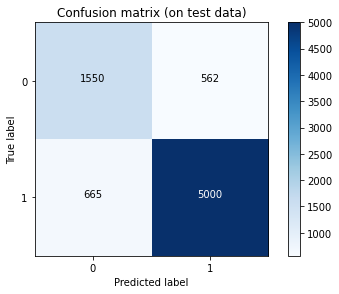

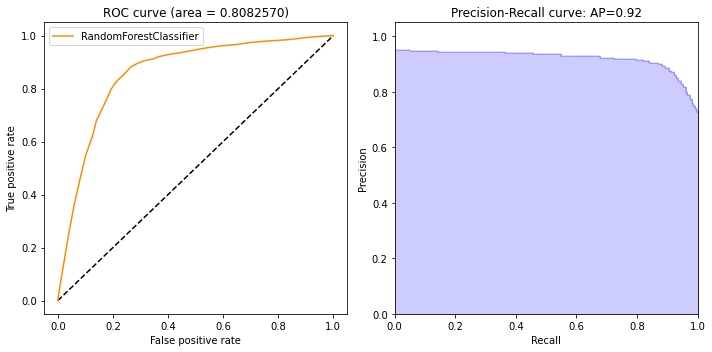


AUC scores on testing data
RandomForestClassifier auc score: 0.8584153678220868
Confusion Matrix : 

 [[1550  665]
 [ 562 5000]]
Classification Report : 

               precision    recall  f1-score   support

           0       0.73      0.70      0.72      2215
           1       0.88      0.90      0.89      5562

    accuracy                           0.84      7777
   macro avg       0.81      0.80      0.80      7777
weighted avg       0.84      0.84      0.84      7777
 

RandomForestClassifier(n_estimators=32)


In [20]:
### Import Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pickle
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error
from sklearn.metrics import f1_score, precision_score, recall_score, log_loss, r2_score
from sklearn.metrics import precision_recall_curve
from tabulate import tabulate
import itertools

warnings.filterwarnings('ignore')

feature_list = pd.read_csv("C:/Users/Shatabdi/Documents/B73_V5_data/final_data_for_Db/collection/seq_top_25_features.txt",header=None)

Core_X = core_2.drop('core_label', axis=1)  

X = Core_X[feature_list[0]]
y = core_2['core_label'] 
cat_col = ['ID','classical_label','core_label','Origin','Subcel1','Subcel2','Subcel3','Subcel4','Subcel5','Localization','Type','chromosome']
num_col = [ele for ele in X.columns if ele not in cat_col]
len(num_col)

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=0)
x_train = x_train.fillna(0)
x_test = x_test.fillna(0)

#### Data Preprocessing

from sklearn.preprocessing import StandardScaler
testPerformanceData = pd.DataFrame(columns = ['Algorithm','Accuracy','AUC','Precision','Recall','F1'])
clf_name = "RandomForestClassifier"
scaler = StandardScaler()

x_train[num_col] = scaler.fit_transform(x_train[num_col])
x_test = scaler.transform(x_test)
print("test : " , x_test)

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(x_train, y_train)

# print(X_res.head())
##
from sklearn.ensemble import RandomForestClassifier
clf_et = RandomForestClassifier(n_estimators = 32)
clf_et.fit(X_res, y_res)
predictions = clf_et.predict(x_test)
y_probabilities_test = clf_et.predict_proba(x_test)
y_probabilities_success = y_probabilities_test[:, 1]

from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_probabilities_success)
print('Average precision-recall score: {0:0.2f}'.format(average_precision))

false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_probabilities_success)

mse        = mean_squared_error(y_test, predictions)
logloss    = log_loss(y_test, predictions)
accuracy   = accuracy_score(y_test, predictions)
precision  = precision_score(y_test, predictions, average='binary')
recall     = recall_score(y_test, predictions, average='binary')
F1         = f1_score(y_test, predictions)
r2         = r2_score(y_test, predictions)
auc        = roc_auc_score(y_test, predictions)
cm         = confusion_matrix(y_test, predictions)
testPerformanceData = testPerformanceData.append({'Algorithm' : clf_name,'Accuracy' : accuracy,'Average_Precision':average_precision,'F1' : F1 ,'Precision' : precision,'Recall' : recall,'AUC' : auc},ignore_index = True)
Print_Model_Metrics("RandomForestClassifier")
Plot_Confusion_Matrix(clf_et)
Plot_ROC_Precision_Recall("RandomForestClassifier")
auc = roc_auc_score(y_test, clf_et.predict_proba(x_test)[:, 1])
print("")  
print("AUC scores on testing data")       
print("RandomForestClassifier", 'auc score:', auc)

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print("Confusion Matrix : \n\n" , confusion_matrix(predictions,y_test))

print("Classification Report : \n\n" , classification_report(predictions,y_test),"\n")


pickle.dump(clf_et, open('seq_model.pkl', 'wb'))
pickle.dump(scaler, open('seq_scaler.pkl', 'wb'))

model = pickle.load(open('seq_model.pkl', 'rb'))
print(model)

In [21]:
#Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools

#scikit-learn package (https://pypi.org/project/scikit-learn)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.metrics import make_scorer

#eli5 package (https://eli5.readthedocs.io/en/latest)
import eli5
from eli5.sklearn import PermutationImportance

#shap package (https://github.com/slundberg/shap)
import shap

findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


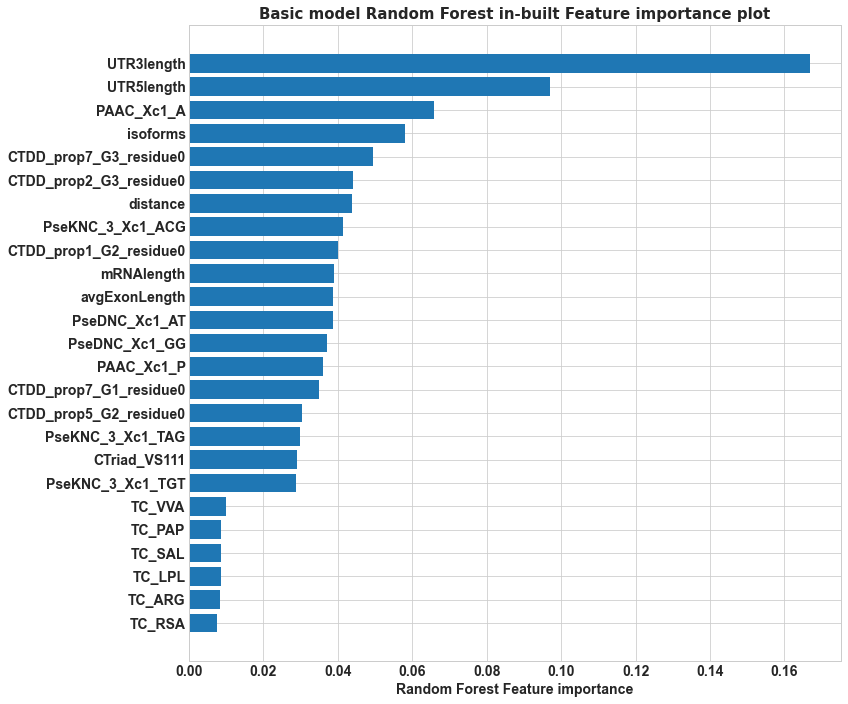

In [22]:
# Feature importance dataframe
imp_df = pd.DataFrame({'feature': X_res.columns.values,
                       'importance': clf_et.feature_importances_})
 
# Reorder by importance
ordered_df = imp_df.sort_values(by='importance')
imp_range=range(1,len(imp_df.index)+1)
 
## Barplot with confidence intervals
height = ordered_df['importance']
bars = ordered_df['feature']
y_pos = np.arange(len(bars))
plt.figure(figsize=(12,10))
plt.style.use('seaborn-whitegrid')
plt.rcParams["font.weight"] = "bold"
plt.rcParams["font.size"] = 14
plt.rcParams["axes.labelweight"] = "bold"
# Create horizontal bars
plt.barh(y_pos, height)
 
# Create names on the y-axis
plt.yticks(y_pos, bars)

plt.xlabel("Random Forest Feature importance")
plt.title('Basic model Random Forest in-built Feature importance plot', fontname="Arial Black", size=15,fontweight="bold")
plt.tight_layout()
plt.savefig('BasicFeature_imp.png')
# Show graphic
plt.show()

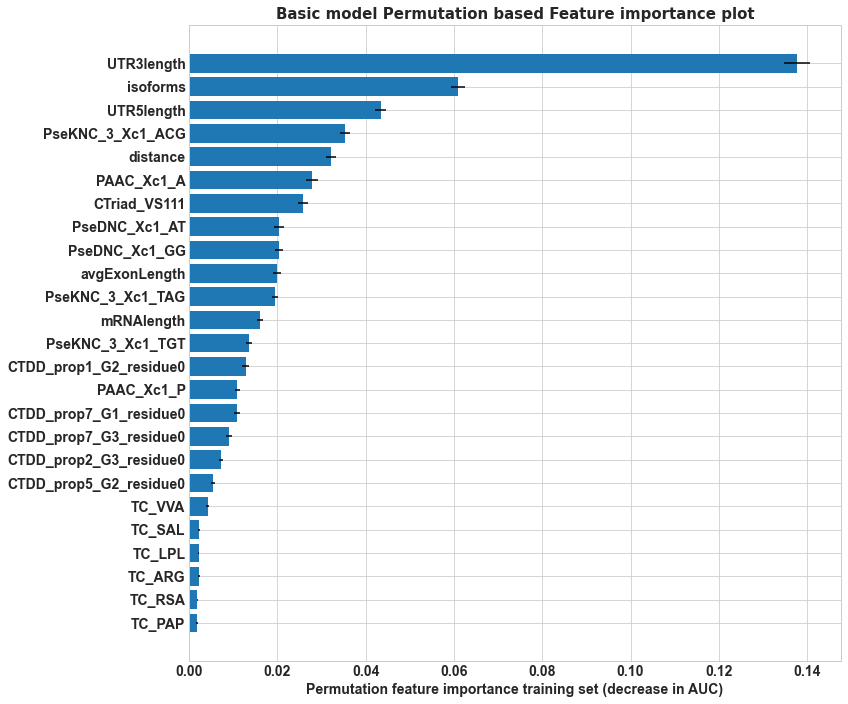

In [23]:
# Feature importance based on TRAINING set

perm_test = PermutationImportance(clf_et, scoring=make_scorer(roc_auc_score),
                                   n_iter=50, random_state=123, cv="prefit")

# fit and see the permuation importances
perm_test.fit(X_res, y_res)

imp_df = eli5.explain_weights_df(perm_test)
label_df = pd.DataFrame({'feature': [ "x" + str(i) for i in range(len(X_res.columns))], 'feature_name': X_res.columns.values})
imp_df = pd.merge(label_df, imp_df, on='feature', how='inner', validate="one_to_one")
 
# Reorder by importance
ordered_df = imp_df.sort_values(by='weight')
imp_range=range(1,len(imp_df.index)+1)
 

## Barplot with confidence intervals
plt.figure(figsize=(12,10))
plt.style.use('seaborn-whitegrid')
plt.rcParams["font.weight"] = "bold"
plt.rcParams["font.size"] = 14
plt.rcParams["axes.labelweight"] = "bold"
height = ordered_df['weight']
bars = ordered_df['feature_name']
ci = 1.96 * ordered_df['std']
y_pos = np.arange(len(bars))

# Create horizontal bars
plt.barh(y_pos, height, xerr=ci)
 
# Create names on the y-axis
plt.yticks(y_pos, bars)
plt.title('Basic model Permutation based Feature importance plot', fontname="Arial Black", size=15,fontweight="bold")
plt.xlabel("Permutation feature importance training set (decrease in AUC)")
plt.tight_layout()
plt.savefig('Basic_Permutation_Feature_imp.png')
# Show graphic
plt.show()

In [24]:
# explain the model's predictions on test set using SHAP values
# same syntax works for xgboost, LightGBM, CatBoost, and some scikit-learn models
X_explain = X_res
# X_explain = x_test
explainer = shap.TreeExplainer(clf_et)

# shap_values consists of a list of two matrices of dimension samplesize x #features
# The first matrix uses average nr of benign samples as base value
# The second matrix which is used below uses average nr of malignant samples as base value 
shap_values = explainer.shap_values(X_explain)


# Interactive visualization of the explanation of the first subject
# in the test set (X_explain).
# It shows the relative contribution of features to get from the base value of malignant
# samples(average value)
# to the output value (1 in case of malignant sample)
# the numbers at the bottom show the actual values for this sample.
shap.initjs() #initialize javascript in cell
shap.force_plot(explainer.expected_value, shap_values[0,:], X_explain.iloc[0,:])


TypeError: list indices must be integers or slices, not tuple

In [ ]:
#Same as above, but with violin plots to better see the distribution of shapley values 
shap.summary_plot(shap_values, X_res, plot_type="violin")

In [ ]:
#A summary plot with the shapley value (feature importance) 
shap.summary_plot(shap_values, X_res)

test :  [[ 0.11176918  1.56178688 -0.02880431 ... -0.37700911 -0.66762636
   1.28343212]
 [ 0.31648989  0.11381726 -0.20849304 ... -0.37700911 -0.66762636
  -0.32616748]
 [-0.95881943  0.83780207 -0.85879512 ... -0.37700911  3.28381502
  -0.32616748]
 ...
 [-0.13658053  0.11381726 -0.57642711 ... -0.37700911  0.46135689
  -0.32616748]
 [ 1.39714674 -0.61016756  0.04820515 ... -0.37700911 -0.10313473
  -0.32616748]
 [-0.44533962 -0.61016756 -0.30261571 ... -0.37700911 -1.23211798
  -0.32616748]]
Average precision-recall score: 0.92
╒════════════════════════╤═══════════════════════╕
│ Metric                 │   Testing Performance │
╞════════════════════════╪═══════════════════════╡
│ accuracy               │              0.839398 │
├────────────────────────┼───────────────────────┤
│ precision              │              0.891212 │
├────────────────────────┼───────────────────────┤
│ recall                 │              0.887908 │
├────────────────────────┼───────────────────────┤
│ mi

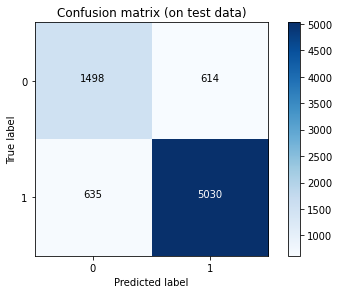

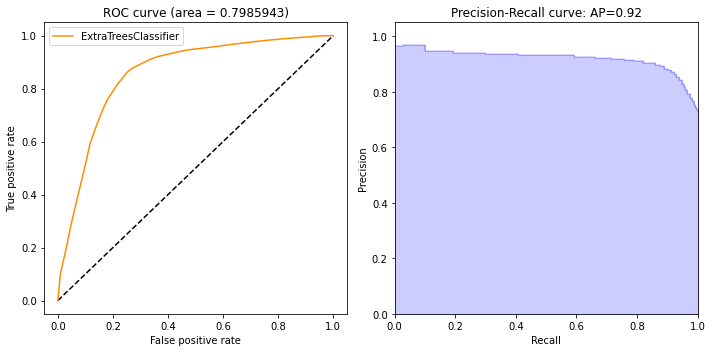


AUC scores on testing data
ExtraTreesClassifier auc score: 0.8567485172778089
Confusion Matrix : 

 [[1498  635]
 [ 614 5030]]
Classification Report : 

               precision    recall  f1-score   support

           0       0.71      0.70      0.71      2133
           1       0.89      0.89      0.89      5644

    accuracy                           0.84      7777
   macro avg       0.80      0.80      0.80      7777
weighted avg       0.84      0.84      0.84      7777
 

ExtraTreesClassifier(n_estimators=32)


In [21]:
### Import Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pickle
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error
from sklearn.metrics import f1_score, precision_score, recall_score, log_loss, r2_score
from sklearn.metrics import precision_recall_curve
from tabulate import tabulate
import itertools

warnings.filterwarnings('ignore')

feature_list = pd.read_csv("C:/Users/Shatabdi/Documents/B73_V5_data/final_data_for_Db/collection/seq_top_25_features.txt",header=None)

Core_X = core_2.drop('core_label', axis=1)  

X = Core_X[feature_list[0]]
y = core_2['core_label'] 
cat_col = ['ID','classical_label','core_label','Origin','Subcel1','Subcel2','Subcel3','Subcel4','Subcel5','Localization','Type','chromosome']
num_col = [ele for ele in X.columns if ele not in cat_col]
len(num_col)

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=0)
x_train = x_train.fillna(0)
x_test = x_test.fillna(0)

#### Data Preprocessing

from sklearn.preprocessing import StandardScaler
testPerformanceData = pd.DataFrame(columns = ['Algorithm','Accuracy','AUC','Precision','Recall','F1'])
clf_name = "ExtraTreesClassifier"
scaler = StandardScaler()

x_train[num_col] = scaler.fit_transform(x_train[num_col])
x_test = scaler.transform(x_test)
print("test : " , x_test)

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(x_train, y_train)

# print(X_res.head())
##
from sklearn.ensemble import ExtraTreesClassifier
clf_et = ExtraTreesClassifier(n_estimators = 32)
clf_et.fit(X_res, y_res)
predictions = clf_et.predict(x_test)
y_probabilities_test = clf_et.predict_proba(x_test)
y_probabilities_success = y_probabilities_test[:, 1]

from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_probabilities_success)
print('Average precision-recall score: {0:0.2f}'.format(average_precision))

false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_probabilities_success)

mse        = mean_squared_error(y_test, predictions)
logloss    = log_loss(y_test, predictions)
accuracy   = accuracy_score(y_test, predictions)
precision  = precision_score(y_test, predictions, average='binary')
recall     = recall_score(y_test, predictions, average='binary')
F1         = f1_score(y_test, predictions)
r2         = r2_score(y_test, predictions)
auc        = roc_auc_score(y_test, predictions)
cm         = confusion_matrix(y_test, predictions)
testPerformanceData = testPerformanceData.append({'Algorithm' : clf_name,'Accuracy' : accuracy,'Average_Precision':average_precision,'F1' : F1 ,'Precision' : precision,'Recall' : recall,'AUC' : auc},ignore_index = True)
Print_Model_Metrics("ExtraTreesClassifier")
Plot_Confusion_Matrix(clf_et)
Plot_ROC_Precision_Recall("ExtraTreesClassifier")
auc = roc_auc_score(y_test, clf_et.predict_proba(x_test)[:, 1])
print("")  
print("AUC scores on testing data")       
print("ExtraTreesClassifier", 'auc score:', auc)

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print("Confusion Matrix : \n\n" , confusion_matrix(predictions,y_test))

print("Classification Report : \n\n" , classification_report(predictions,y_test),"\n")


# pickle.dump(clf_et, open('seq_model.pkl', 'wb'))
# pickle.dump(scaler, open('seq_scaler.pkl', 'wb'))

# model = pickle.load(open('seq_model.pkl', 'rb'))
# print(model)

test :  [[ 0.11176918  1.56178688 -0.02880431 ... -0.37700911 -0.66762636
   1.28343212]
 [ 0.31648989  0.11381726 -0.20849304 ... -0.37700911 -0.66762636
  -0.32616748]
 [-0.95881943  0.83780207 -0.85879512 ... -0.37700911  3.28381502
  -0.32616748]
 ...
 [-0.13658053  0.11381726 -0.57642711 ... -0.37700911  0.46135689
  -0.32616748]
 [ 1.39714674 -0.61016756  0.04820515 ... -0.37700911 -0.10313473
  -0.32616748]
 [-0.44533962 -0.61016756 -0.30261571 ... -0.37700911 -1.23211798
  -0.32616748]]
Average precision-recall score: 0.93
╒════════════════════════╤═══════════════════════╕
│ Metric                 │   Testing Performance │
╞════════════════════════╪═══════════════════════╡
│ accuracy               │              0.836955 │
├────────────────────────┼───────────────────────┤
│ precision              │              0.885229 │
├────────────────────────┼───────────────────────┤
│ recall                 │              0.891792 │
├────────────────────────┼───────────────────────┤
│ mi

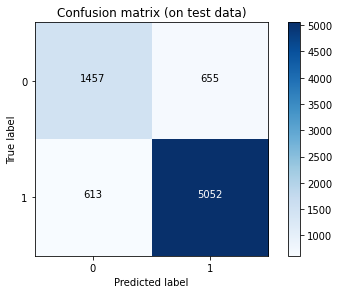

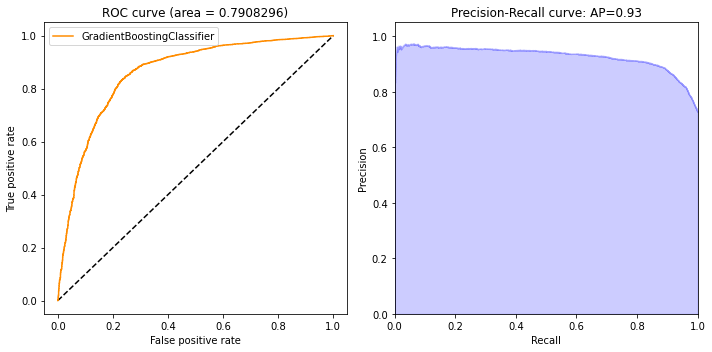


AUC scores on testing data
GradientBoostingClassifier auc score: 0.8586817396159299
Confusion Matrix : 

 [[1457  613]
 [ 655 5052]]
Classification Report : 

               precision    recall  f1-score   support

           0       0.69      0.70      0.70      2070
           1       0.89      0.89      0.89      5707

    accuracy                           0.84      7777
   macro avg       0.79      0.79      0.79      7777
weighted avg       0.84      0.84      0.84      7777
 

GradientBoostingClassifier(learning_rate=0.8, n_estimators=32)


In [23]:
### Import Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pickle
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error
from sklearn.metrics import f1_score, precision_score, recall_score, log_loss, r2_score
from sklearn.metrics import precision_recall_curve
from tabulate import tabulate
import itertools

warnings.filterwarnings('ignore')

feature_list = pd.read_csv("C:/Users/Shatabdi/Documents/B73_V5_data/final_data_for_Db/collection/seq_top_25_features.txt",header=None)

Core_X = core_2.drop('core_label', axis=1)  

X = Core_X[feature_list[0]]
y = core_2['core_label'] 
cat_col = ['ID','classical_label','core_label','Origin','Subcel1','Subcel2','Subcel3','Subcel4','Subcel5','Localization','Type','chromosome']
num_col = [ele for ele in X.columns if ele not in cat_col]
len(num_col)

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=0)
x_train = x_train.fillna(0)
x_test = x_test.fillna(0)

#### Data Preprocessing

from sklearn.preprocessing import StandardScaler
testPerformanceData = pd.DataFrame(columns = ['Algorithm','Accuracy','AUC','Precision','Recall','F1'])
clf_name = "GradientBoostingClassifier"
scaler = StandardScaler()

x_train[num_col] = scaler.fit_transform(x_train[num_col])
x_test = scaler.transform(x_test)
print("test : " , x_test)

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(x_train, y_train)

# print(X_res.head())
##
from sklearn.ensemble import GradientBoostingClassifier
clf_et = GradientBoostingClassifier(n_estimators = 32,learning_rate=0.8)
clf_et.fit(X_res, y_res)
predictions = clf_et.predict(x_test)
y_probabilities_test = clf_et.predict_proba(x_test)
y_probabilities_success = y_probabilities_test[:, 1]

from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, y_probabilities_success)
print('Average precision-recall score: {0:0.2f}'.format(average_precision))

false_positive_rate, true_positive_rate, threshold = roc_curve(y_test, y_probabilities_success)

mse        = mean_squared_error(y_test, predictions)
logloss    = log_loss(y_test, predictions)
accuracy   = accuracy_score(y_test, predictions)
precision  = precision_score(y_test, predictions, average='binary')
recall     = recall_score(y_test, predictions, average='binary')
F1         = f1_score(y_test, predictions)
r2         = r2_score(y_test, predictions)
auc        = roc_auc_score(y_test, predictions)
cm         = confusion_matrix(y_test, predictions)
testPerformanceData = testPerformanceData.append({'Algorithm' : clf_name,'Accuracy' : accuracy,'Average_Precision':average_precision,'F1' : F1 ,'Precision' : precision,'Recall' : recall,'AUC' : auc},ignore_index = True)
Print_Model_Metrics("GradientBoostingClassifier")
Plot_Confusion_Matrix(clf_et)
Plot_ROC_Precision_Recall("GradientBoostingClassifier")
auc = roc_auc_score(y_test, clf_et.predict_proba(x_test)[:, 1])
print("")  
print("AUC scores on testing data")       
print("GradientBoostingClassifier", 'auc score:', auc)

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

print("Confusion Matrix : \n\n" , confusion_matrix(predictions,y_test))

print("Classification Report : \n\n" , classification_report(predictions,y_test),"\n")


# pickle.dump(clf_et, open('seq_model.pkl', 'wb'))
# pickle.dump(scaler, open('seq_scaler.pkl', 'wb'))

# model = pickle.load(open('seq_model.pkl', 'rb'))
# print(model)